In [1]:
import os
import pandas as pd
import numpy as np
import networkx as nx
import matplotlib.pyplot as plt
import plotly.graph_objs as go
from plotly.subplots import make_subplots
import plotly.io as pio
import plotly
import plotly.offline as pyo

os.getcwd()

'/home/user/onchain_data_analysis/WEMIX_data/Dongeun/final_presentation'

In [2]:
ls

 Centrality.ipynb
 GATEIO_WEMIXUSDT_D.xlsx
'Top10WEMIXfrom2022-11-10 00:00:00to2022-11-24 00:00:00_morethan1_fit_results.csv'
 Untitled.ipynb
 WEMIX_2022-10-24~2022-12-31_centrality.csv
 WEMIX_2022-10-24~2023-02-22_centrality.csv
'WEMIX_2022-11-10 00:00:00_2022-11-24 00:00:00_CDF_graph_plot.png'
'WEMIX_2022-11-14 00:00:00_2022-11-24 00:00:00_CDF_graph_plot.html'
 WEMIX_2022-11-24~2023-02-22_cal.csv
 WEMIX_2022-11-24~2023-02-23.csv
'WEMIX_2022-11-25 00:00:00_2022-12-10 00:00:00_CDF_graph_plot.html'
'WEMIX_2022-11-25 00:00:00_2022-12-10 00:00:00_CDF_graph_plot.png'
'WEMIX_2022_11.10~11.24_TOP50_sender&receiver.csv'
'WEMIX_2022_11.25~12.10_TOP50_sender&receiver.csv'
 WEMIX_2022_2023_sum_address.csv
'WEMIX_2023-01-01~2023-02-22_centrality(in_out).csv'
'WEMIX_2023-02-05 00:00:00_2023-02-20 00:00:00_CDF_graph_plot.html'
'WEMIX_2023-02-05 00:00:00_2023-02-20 00:00:00_CDF_graph_plot.png'
'WEMIX_2023-02-09 00:00:00_2023-02-23 00:00:00_CDF_graph_plot.html'
'WEMIX_2023-02-09 00:00:00_2023-02-23 0

In [3]:
file_path = './WEMIX_2022_2023_sum_address.csv'
data = pd.read_csv(file_path, index_col = 0)
data = data[data['amount'] >=1 ]
data['label'] = data.index


data['date'] = pd.to_datetime(data['date'])
dates = sorted(data['date'].unique())
data

,sender_address,receiver_address,date,count,amount,label
1,0x345b4ffa49cc48fbbbdc418dc5ed856aaadd1c4a,0xc8f2200d72fb47f4062cb36bc183e948b5db351b,2022-10-24,3,10872.593307,1
3,0x8e51dc9dd6d212d1753b93d4454172c2dcb9dffe,0x9dd35021d77c1de5ed50b9d788a2f68903a96b96,2022-10-24,1,4.091199,3
4,0xad466b64c24d3838dc01f82d1259fea0cb6c6c76,0x2bf9b864cdc97b08b6d79ad4663e71b8ab65c45c,2022-10-24,2,1695.762910,4
6,0xf3f5560e7088b160a335399be5c8c07008ca58d5,0x2b16301254094079005acfaca54b295d91fd14d3,2022-10-24,1,5.101227,6
8,0xad3ff98aca8ae94733f22009ae1ae1cd7ef49362,0x3cb3890004e8f5a6885c1d8d359e8c2946b504f3,2022-10-24,1,94.397975,8
...,...,...,...,...,...,...
445542,0xc6a2ad8cc6e4a7e08fc37cc5954be07d499e7654,0x8e2fcbde00aafe1faa58999be95a32f9851e9c6c,2023-02-23,1,178.700258,445542
445543,0xc6a2ad8cc6e4a7e08fc37cc5954be07d499e7654,0x1f279423429d8279d0653fc6a7e5870fce3750b0,2023-02-23,1,14.572874,445543
445544,0x71b59e4bc2995b57aa03437ed645ada7dd5b1890,0x1f0708335cbcc7dd0a25944667f95abae97f85c2,2023-02-23,1,9.091071,445544
445546,0xc6a2ad8cc6e4a7e08fc37cc5954be07d499e7654,0x1f10cf4812749350670cee2a5648338b9e2ee713,2023-02-23,1,22.978523,445546


In [4]:
label_df = pd.read_excel('sender_receiver_total.xlsx')
label_df

,address,label,date
0,0x000000000000000000000000000000000000dead,Null: 0xDead,1
1,0x0051ef9259c7ec0644a80e866ab748a2f30841b3,Bybit 1,1
2,0x14690a6cbf3d798702c1943be5937b40b552665a,NaN,1
3,0x146f592b3f3707a7c72caf21d6c9ca944adf531a,NaN,1
4,0x15055b9098454acd34982be366d2c7c7d5edaea1,NaN,1
...,...,...,...
192,0xef937c54ca643fcdd28d34b8d4748c9f7c8c6ac3,NaN,3
193,0xf101ee5c836d0021a75652c17e73f684a568e06e,NaN,3
194,0xf4339186e25d8728cfe9dc67822d65d473d32195,NaN,3
195,0xf50782a24afcb26acb85d086cf892bfffb5731b5,contract,3


In [5]:
# 'address'를 인덱스로 설정하고 'label' 열만 선택하여 딕셔너리로 변환
label_dict = label_df.set_index('address')['label'].to_dict()
label_dict

{'0x000000000000000000000000000000000000dead': '소각',
 '0x0051ef9259c7ec0644a80e866ab748a2f30841b3': 'Bybit 1',
 '0x14690a6cbf3d798702c1943be5937b40b552665a': nan,
 '0x146f592b3f3707a7c72caf21d6c9ca944adf531a': nan,
 '0x15055b9098454acd34982be366d2c7c7d5edaea1': nan,
 '0x1cc00cc60f0b031bb8d460358e27ab2857a07c0d': nan,
 '0x1ddda8ca41f858446cbc5953f8da7f8ee356b922': 'OKX 2',
 '0x20c0b29d51cb12fd72b3c30e144289f146a1f7c9': nan,
 '0x29e3f9eefe04d77c89533dc317fe980edc89665f': nan,
 '0x2bebca90e8676c9e1bb5d51e35cf47e5555d40cc': nan,
 '0x2bf9b864cdc97b08b6d79ad4663e71b8ab65c45c': 'contract',
 '0x2d200fcd75ab84956d1906d5c8c691ef465c9307': nan,
 '0x2d803838cb2d40eacb0207ec4e567e2a8886b47f': 'contract',
 '0x2d877462b21c802a926f2d25383da5a0a845bf82': nan,
 '0x2fb205ab8e2b62d1975de7f8c3a82159fb864ed6': 'WEMIX Reserve 3',
 '0x32f7cd5319e7b2d7550519e9d3ac29061141e3d3': nan,
 '0x3406108f2da00a50cfabe7b124768349cbc802bc': nan,
 '0x348acec176d0457ecb3b596ff9d9d9c089cafdf1': nan,
 '0x3cd000527bd63acfc4f6c

In [6]:
label_dict['0x000000000000000000000000000000000000dead'] = 'burn'
label_dict

{'0x000000000000000000000000000000000000dead': 'burn',
 '0x0051ef9259c7ec0644a80e866ab748a2f30841b3': 'Bybit 1',
 '0x14690a6cbf3d798702c1943be5937b40b552665a': nan,
 '0x146f592b3f3707a7c72caf21d6c9ca944adf531a': nan,
 '0x15055b9098454acd34982be366d2c7c7d5edaea1': nan,
 '0x1cc00cc60f0b031bb8d460358e27ab2857a07c0d': nan,
 '0x1ddda8ca41f858446cbc5953f8da7f8ee356b922': 'OKX 2',
 '0x20c0b29d51cb12fd72b3c30e144289f146a1f7c9': nan,
 '0x29e3f9eefe04d77c89533dc317fe980edc89665f': nan,
 '0x2bebca90e8676c9e1bb5d51e35cf47e5555d40cc': nan,
 '0x2bf9b864cdc97b08b6d79ad4663e71b8ab65c45c': 'contract',
 '0x2d200fcd75ab84956d1906d5c8c691ef465c9307': nan,
 '0x2d803838cb2d40eacb0207ec4e567e2a8886b47f': 'contract',
 '0x2d877462b21c802a926f2d25383da5a0a845bf82': nan,
 '0x2fb205ab8e2b62d1975de7f8c3a82159fb864ed6': 'WEMIX Reserve 3',
 '0x32f7cd5319e7b2d7550519e9d3ac29061141e3d3': nan,
 '0x3406108f2da00a50cfabe7b124768349cbc802bc': nan,
 '0x348acec176d0457ecb3b596ff9d9d9c089cafdf1': nan,
 '0x3cd000527bd63acfc4f

In [13]:
# # # 'sender_address' 또는 'receiver_address' 열에서 값 확인 (둘 중 하나 선택)
filtered_data = data[data['sender_address'].isin(['0xdc18adf272145ccb2041b852fd4f4e0fab12be86'])] 

# # # 또는
# # filtered_data = data[data['receiver_address'].isin(['0xdc18adf272145ccb2041b852fd4f4e0fab12be86'])] 

filtered_data.tail(50)

,sender_address,receiver_address,date,count,amount,label
12528,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x2d877462b21c802a926f2d25383da5a0a845bf82,2022-10-25,2,5.900010e+06,12528
183043,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x2d877462b21c802a926f2d25383da5a0a845bf82,2022-11-24,1,1.800000e+07,183043
247700,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x2d877462b21c802a926f2d25383da5a0a845bf82,2022-12-08,1,1.000000e+07,247700
247701,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x4d1bc1eaa60008d2a0833bb7a93a12f7fd49a7b9,2022-12-08,1,2.000000e+07,247701
275557,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x2d877462b21c802a926f2d25383da5a0a845bf82,2022-12-11,1,1.000000e+07,275557
324565,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x2d877462b21c802a926f2d25383da5a0a845bf82,2022-12-30,1,1.000000e+07,324565
428809,0xdc18adf272145ccb2041b852fd4f4e0fab12be86,0x2d877462b21c802a926f2d25383da5a0a845bf82,2023-02-17,1,2.000000e+06,428809


10월 24일부터 10일씩 쪼개서 그래프를 그려볼 예정. 각각에서 자주 나타나는 주소를 그려봐야겠죠?

## 이 아래는 이것저것 실행해보면서 코드 디버깅 에러 해결

In [34]:
'0x59984b32ac94a8a32a1c3d9d9b2154d54de518ae' in data['receiver_address']

False

In [35]:
A = data.groupby('sender_address')['amount'].sum()
A['0x0000005c7dc69d405f09aaadca29068d4f88cde8']

544409.6617782108

In [36]:
# top_sender
# WEMIX Reserve 1
# WEMIX Reserve 2
# x
# bonded WEMIX(smart_contract)

In [4]:
# 가장 많이 전송한 30개의 주소만 주황색으로 표시.
top_sender_30 = data[:10].groupby('sender_address')['amount'].max().nlargest(30).index
top_receiver_30 = data[:10].groupby('receiver_address')['amount'].max().nlargest(30).index

# print(top_sender_30)
# print(top_receiver_30)
top_15_common_nodes = top_sender_30.union(top_receiver_30)

In [38]:
data[:10]

,sender_address,receiver_address,date,count,amount,label
1,0x003f2871daf98e2dc88e4c731aa267440f2ea2c3,0xe52533b127c165774568f8128046ecdbd0cbd084,2022-10-24,2,482.438097,1
3,0x003f2871daf98e2dc88e4c731aa267440f2ea2c3,0xe762c7daf8d761580fe82f74bef558cc75ecdba4,2022-10-24,1,15.144897,3
6,0x43109af38f225d26277f54ac3b3edb3585bcf68c,0xfa38931dab27401e249cd7d4b6b23e5c04f4dd80,2022-10-24,1,151.882899,6
8,0x93ea301b6e179bc72347ca2e3155ecb9442d877b,0xc8f2200d72fb47f4062cb36bc183e948b5db351b,2022-10-24,1,1400.326202,8
11,0x003f2871daf98e2dc88e4c731aa267440f2ea2c3,0xe7f7c750b1ec5f5b74f80590b231508d9abdb575,2022-10-24,2,34.531030,11
18,0x159e4525097fe327a91e6cd66678da71d45ad6f7,0x3cb3890004e8f5a6885c1d8d359e8c2946b504f3,2022-10-24,1,9.196289,18
20,0xd045410d34fa9b7a94ce52daff749805e2937466,0x9dd35021d77c1de5ed50b9d788a2f68903a96b96,2022-10-24,1,2.272868,20
21,0xfb73a398e445ec7c432fc821209ea994187aacb0,0xce2cc46682e9c6d5f174af598fb4931a9c0be68e,2022-10-24,1,15.358692,21
23,0x6635ecbeb24e540bd531527f22e71434ff7d1122,0xabaeb0f8865052bbb117c7816e96f34858b3d159,2022-10-24,1,7.386000,23
24,0x003f2871daf98e2dc88e4c731aa267440f2ea2c3,0xf2af5cb0499be9a3f1abaa5dff89fc7c6b6f8552,2022-10-24,2,5.546291,24


In [39]:
# 가장 많이 전송한 30개의 주소만 주황색으로 표시.
top_sender_30 = data[:10].groupby('sender_address')['amount'].max().nlargest(50).index
top_receiver_30 = data[:10].groupby('receiver_address')['amount'].max().nlargest(50).index

# print(top_sender_30)
# print(top_receiver_30)
top_15_common_nodes = top_sender_30.union(top_receiver_30)

In [96]:
dates = sorted(data['date'].unique())
dates[100]

Timestamp('2023-02-01 00:00:00')

## 1. 그림 설명
- amount로 node 사이즈 표기(log씌워서 표기)
- sender/receiver 상위 30개씩 뽑아서 둘 다 속하면 녹색, sender에만 속하면 주황색, receiver에만 속하면 붉은색으로 표현


In [8]:
# ## 이코드는 자리를 고정. 그런데 이전 노드들의 위치를 남겨두라 했더니 amount=0인데도 사라지지 않아 문제 발생
# dates = sorted(data['date'].unique())
# dates = dates[17:32] # 11.10~11.24 : 17:32, 11.24~12.10 32:48, 2.5~2.20 104:120

# # 해당기간에 가장 많이 전송/수신한 50개의 주소만 추출
# top_sender_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('sender_address')['amount'].max().nlargest(50).index
# top_receiver_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('receiver_address')['amount'].max().nlargest(50).index

# # 이름이 안맞긴 하지만 코드에서 전체적으로 바꾸기 번거로워서 우선 사용
# top_15_common_nodes = top_sender_30.union(top_receiver_30)

# traces = []
# buttons = []

# node_label_mapping = {}
# label_counter = 1

# # Initialize min and max for x and y to calculate global range
# global_x_min, global_x_max = float('inf'), float('-inf')
# global_y_min, global_y_max = float('inf'), float('-inf')

# # Initialize a dictionary to store the positions of nodes from the previous day
# previous_pos = {}

# #----------------------------------------------------------------------------------------------------------------------------------#
# #-------------------------------------------------- 위치 정하는 코드  -----------------------------------------------------------------#
# #----------------------------------------------------------------------------------------------------------------------------------#

# # Iterate through the dates to create frames and find global ranges
# for date in dates:
#     daily_df = data[data['date'] == date]
    
#     # 상위 10개의 송신/수신 노드를 선택
#     daily_data = daily_df.sort_values('amount', ascending=False)
#     daily_data = daily_data.head(300)
    
#     G = nx.DiGraph()

#     for _, row in daily_data.iterrows():
#         sender = row['sender_address']
#         receiver = row['receiver_address']
#         amount = row['amount']

#         if sender not in node_label_mapping:
#             node_label_mapping[sender] = f"{label_counter}"
#             label_counter += 1
#         if receiver not in node_label_mapping:
#             node_label_mapping[receiver] = f"{label_counter}"
#             label_counter += 1

#         G.add_node(sender, label=node_label_mapping[sender])
#         G.add_node(receiver, label=node_label_mapping[receiver])
#         G.add_edge(sender, receiver, weight=amount)

#     # Use the previous positions as the initial positions for the current day's layout if available
#     if previous_pos:
#         pos = nx.spring_layout(G, k=1, iterations=50, pos=previous_pos)
#     else:
#         pos = nx.spring_layout(G, k=1, iterations=50)

#     # Store the current positions for the next day's layout
#     previous_pos = pos

#     # Update global min and max values for x and y
#     x_values = [p[0] for p in pos.values()]
#     y_values = [p[1] for p in pos.values()]
    
#     global_x_min, global_x_max = min(global_x_min, min(x_values)), max(global_x_max, max(x_values))
#     global_y_min, global_y_max = min(global_y_min, min(y_values)), max(global_y_max, max(y_values))

# # Use the global ranges to define fixed x and y ranges
# fixed_x_range = [global_x_min * 1.3, global_x_max * 1.3]
# fixed_y_range = [global_y_min * 1.3, global_y_max * 1.3]

# #----------------------------------------------------------------------------------------------------------------------------------#
# #-------------------------------------------------- 그래프 그리는 코드 -----------------------------------------------------------------#
# #----------------------------------------------------------------------------------------------------------------------------------#

# # Create frames with the fixed ranges
# previous_pos = {}  # Reinitialize to reuse in the second loop
# for date in dates:
#     daily_df = data[data['date'] == date]
#     # 송신된 amount의 합
#     sent_amount = daily_df.groupby('sender_address')['amount'].sum()
#     # 수신된 amount의 합 (존재하지 않으면 0으로 설정)
#     received_amount = daily_df.groupby('receiver_address')['amount'].sum()
    
#     daily_data = daily_df.sort_values('amount', ascending=False)
#     daily_data = daily_data.head(300)

    
#     G = nx.DiGraph()

#     for _, row in daily_data.iterrows():
#         sender = row['sender_address']
#         receiver = row['receiver_address']
#         amount = row['amount']

#         # Sender address가 node_label_mapping에 없으면 추가
#         if sender not in node_label_mapping:
#             node_label_mapping[sender] = f"{label_counter}"
            
    
#         # Receiver address가 node_label_mapping에 없으면 추가
#         if receiver not in node_label_mapping:
#             node_label_mapping[receiver] = f"{label_counter}"
            

#         G.add_node(sender, label=node_label_mapping[sender])
#         G.add_node(receiver, label=node_label_mapping[receiver]) 
#         G.add_edge(sender, receiver, weight=amount)

#     # Use the previous positions if available
#     if previous_pos:
#         pos = nx.spring_layout(G, k=1, iterations=50, pos=previous_pos)
#     else:
#         pos = nx.spring_layout(G, k=1, iterations=50)

#     # Store positions for the next frame
#     previous_pos = pos

#     edge_x = []
#     edge_y = []
#     edge_hover_texts = []
#     edge_widths = []

#     for edge in G.edges():
#         x0, y0 = pos[edge[0]]
#         x1, y1 = pos[edge[1]]
#         edge_x.extend([x0, x1, None])
#         edge_y.extend([y0, y1, None])
#         edge_hover_texts.append(f'{node_label_mapping[edge[0]]} → {node_label_mapping[edge[1]]}<br>Amount: {G.edges[edge]["weight"]}')
#         edge_widths.append(np.log(G.edges[edge]["weight"] + 1))

#     edge_trace = go.Scatter(
#         x=edge_x, y=edge_y,
#         line=dict(width=1, color='#888'),
#         hoverinfo='text',
#         text=edge_hover_texts,
#         mode='lines',
#     )

#     node_x = []
#     node_y = []
#     node_sizes = []
#     node_colors = []
#     node_hover_texts = []
#     node_labels = []

#     for node in G.nodes():
#         # 송신된 amount 값이 있으면 가져오고, 없으면 0으로 설정
#         sent = sent_amount[node] if node in sent_amount else 0
#         sent = sent_amount.get(node, 0)  # .get을 사용해 노드가 없으면 0으로 설정
#         # 수신된 amount의 합
#         received = received_amount.get(node, 0)  # .get을 사용해 노드가 없으면 0으로 설정
#         # 송신 및 수신된 총 amount
#         total_amount = sent + received
        
#         if node in top_sender_30 and node in top_receiver_30:
#             node_colors.append('green')  # top_sender와 top_receiver 모두에 속하면 녹색
#         elif node in top_sender_30:
#             node_colors.append('orange')  # top_sender에만 속하면 주황색
#         elif node in top_receiver_30:
#             node_colors.append('red')     # top_receiver에만 속하면 빨간색
#         else:
#             node_colors.append('lightblue')       
            
#         x, y = pos[node]
#         node_x.append(x)
#         node_y.append(y)
#         node_sizes.append(max(np.log(total_amount*5+1)*10, 3))  # 크기를 조정하기 위해 1000으로 나누고 최소값 5 설정
        
#         # 하늘색이 아닌 노드만 주소 표시
#         if node in top_15_common_nodes:
#             node_labels.append(node_label_mapping[node])
#         else:
#             node_labels.append("")  # 주황색이 아닌 노드에는 라벨을 표시하지 않음
        
#         node_hover_texts.append(f'Name: {"etc" if node not in label_dict else  str(label_dict[node]) if pd.notna(label_dict[node]) else "specific"}<br>Node : {node}<br>Total Amounts: {total_amount}<br>Type: {"Sender and Receiver" if node in top_sender_30 and node in top_receiver_30 else "Sender" if node in top_sender_30 else "Receiver" if node in top_receiver_30 else "etc"}')

#     node_trace = go.Scatter(
#         x=node_x, y=node_y,
#         mode='markers+text',
#         text=node_labels,
#         textposition='top center',
#         textfont=dict(size=12),
#         hoverinfo='text',
#         hovertemplate=node_hover_texts,
#         marker=dict(
#             showscale=False,
#             color=node_colors,
#             size=node_sizes,
#             line_width=2,
#         )
#     )

#     traces.append(go.Frame(
#         data=[edge_trace, node_trace],
#         name=date.strftime('%Y-%m-%d'),
#         layout=go.Layout(
#             xaxis=dict(range=fixed_x_range),
#             yaxis=dict(range=fixed_y_range),
#         )
#     ))

# layout = go.Layout(
#     title=f'{dates[0]}',
#     updatemenus=[{
#         'type': "buttons",
#         'buttons': [
#             dict(
#                 label="Play",
#                 method="animate",
#                 args=[None, dict(frame=dict(duration=2000, redraw=True), fromcurrent=True)]
#             ),
#             dict(
#                 label="Pause",
#                 method="animate",
#                 args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate", transition=dict(duration=0))]
#             )
#         ],
#         'direction': 'left',
#         'pad': dict(r=10, t=87),
#         'showactive': True,
#         'x': 0.1,
#         'xanchor': "right",
#         'y': 0,
#         'yanchor': "top"
#     }],
#     xaxis=dict(showgrid=False, zeroline=False, range=fixed_x_range),
#     yaxis=dict(showgrid=False, zeroline=False, range=fixed_y_range),
#     width=1200,
#     height=800,
#     showlegend=False
# )


# layout.update({
#     'title': f"{dates[0].strftime('%Y-%m-%d')}",
#     'xaxis': dict(showgrid=False, zeroline=False, range=fixed_x_range),
#     'yaxis': dict(showgrid=False, zeroline=False, range=fixed_y_range),
#     'width': 1200,
#     'height': 800,
#     'showlegend': False,
#     'font': dict(size=14),  # Increase the font size
# })

# # Update the title with the date when frames change
# for frame in traces:
#     frame.layout.title = frame.name

# # Modify the traces to include better text visibility
# for frame in traces:
#     for trace in frame.data:
#         if trace.mode == 'markers+text':
#             trace.update(textposition='middle center',  # Adjust text position
#                          textfont=dict(size=16))  # Increase text font size for better visibility

# fig = go.Figure(
#     data=[traces[0].data[0], traces[0].data[1]],
#     layout=layout,
#     frames=traces
# )

# plotly.offline.plot(fig, auto_play = False)


# fig.show()

In [9]:
0xdc18adf272145ccb2041b852fd4f4e0fab12be86 in top_15_common_nodes

NameError: name 'top_15_common_nodes' is not defined

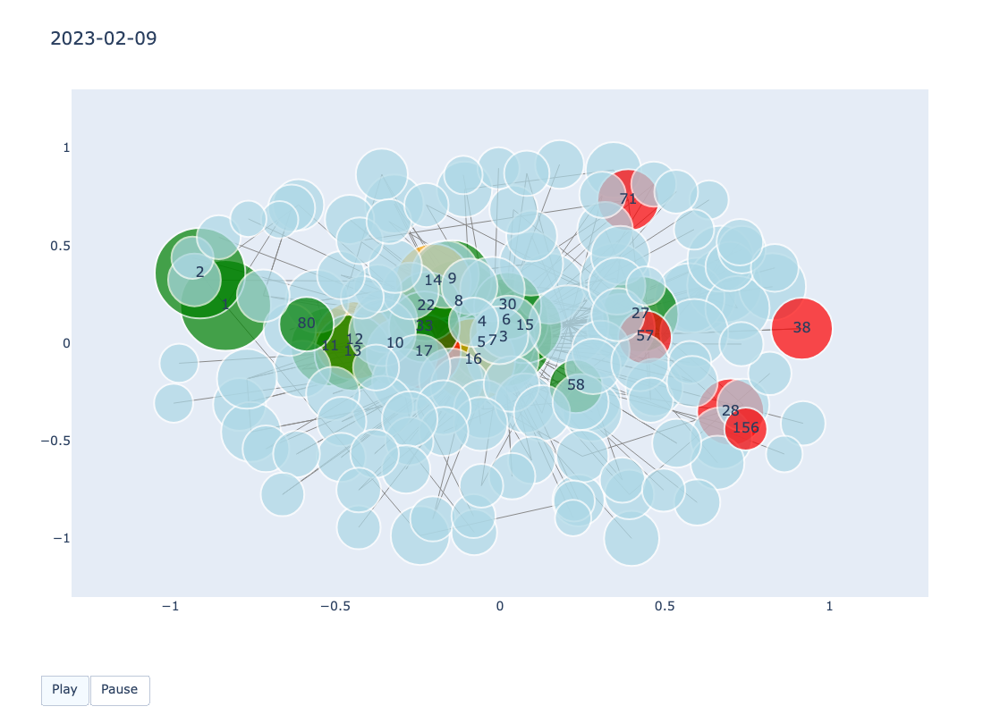

In [25]:
dates = sorted(data['date'].unique())
dates = dates[108:123] # 11.10~11.24 : 17:32, 11.24~12.10 32:48, 2.9~2.23 108:123

# 해당기간에 가장 많이 전송/수신한 50개의 주소만 추출
top_sender_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('sender_address')['amount'].max().nlargest(50).index
top_receiver_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('receiver_address')['amount'].max().nlargest(50).index

# 이름이 안맞긴 하지만 코드에서 전체적으로 바꾸기 번거로워서 우선 사용
top_15_common_nodes = top_sender_30.union(top_receiver_30)

traces = []
buttons = []

node_label_mapping = {}
label_counter = 1

# Initialize the global min and max for x and y to calculate global range
global_x_min, global_x_max = float('inf'), float('-inf')
global_y_min, global_y_max = float('inf'), float('-inf')

# First loop to determine global ranges
for date in dates:
    daily_df = data[data['date'] == date]

    # Select the top 300 transactions by amount
    daily_data = daily_df.sort_values('amount', ascending=False)
    daily_data = daily_data.head(300)

    # Create a new directed graph
    G = nx.DiGraph()

    # Add nodes and edges for the current day's transactions
    for _, row in daily_data.iterrows():
        sender = row['sender_address']
        receiver = row['receiver_address']
        amount = row['amount']
        if sender not in node_label_mapping:
            node_label_mapping[sender] = f"{label_counter}"
            label_counter += 1
        if receiver not in node_label_mapping:
            node_label_mapping[receiver] = f"{label_counter}"
            label_counter += 1

        G.add_node(sender)
        G.add_node(receiver)
        G.add_edge(sender, receiver, weight=amount)

    # Compute node positions with spring layout
    pos = nx.spring_layout(G, k=10, iterations=50)
    
    # Update global min and max for x and y
    x_values = [p[0] for p in pos.values()]
    y_values = [p[1] for p in pos.values()]

    global_x_min, global_x_max = min(global_x_min, min(x_values)), max(global_x_max, max(x_values))
    global_y_min, global_y_max = min(global_y_min, min(y_values)), max(global_y_max, max(y_values))

# Use the global ranges to define fixed x and y ranges
fixed_x_range = [global_x_min * 1.3, global_x_max * 1.3]
fixed_y_range = [global_y_min * 1.3, global_y_max * 1.3]

# Create frames for each date
traces = []
for date in dates:
    daily_df = data[data['date'] == date]
    sent_amount = daily_df.groupby('sender_address')['amount'].sum()
    received_amount = daily_df.groupby('receiver_address')['amount'].sum()
    
    daily_data = daily_df.sort_values('amount', ascending=False)
    daily_data = daily_data.head(300)
    
    # Reinitialize the graph
    G = nx.DiGraph()

    for _, row in daily_data.iterrows():
        sender = row['sender_address']
        receiver = row['receiver_address']
        amount = row['amount']

        # Sender address가 node_label_mapping에 없으면 추가
        if sender not in node_label_mapping:
            node_label_mapping[sender] = f"{label_counter}"
            
    
        # Receiver address가 node_label_mapping에 없으면 추가
        if receiver not in node_label_mapping:
            node_label_mapping[receiver] = f"{label_counter}"

        G.add_node(sender)
        G.add_node(receiver)
        G.add_edge(sender, receiver, weight=amount)

    # Compute node positions using spring layout
    pos = nx.spring_layout(G, k=10, iterations=50)

    # Prepare data for edges
    edge_x = []
    edge_y = []
    edge_hover_texts = []
    edge_widths = []

    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_hover_texts.append(f'{edge[0]} → {edge[1]}<br>Amount: {G.edges[edge]["weight"]}')
        edge_widths.append(np.log(G.edges[edge]["weight"] + 1))

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='#888'),
        hoverinfo='text',
        text=edge_hover_texts,
        mode='lines',
    )

    # Prepare data for nodes
    node_x = []
    node_y = []
    node_sizes = []
    node_colors = []
    node_hover_texts = []
    node_labels = []

    for node in G.nodes():
        sent = sent_amount.get(node, 0)
        received = received_amount.get(node, 0)
        total_amount = sent + received
        
        if node in top_sender_30 and node in top_receiver_30:
            node_colors.append('green')
        elif node in top_sender_30:
            node_colors.append('orange')
        elif node in top_receiver_30:
            node_colors.append('red')
        else:
            node_colors.append('lightblue')

        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_sizes.append(max(np.log(total_amount/100+1)*10, 1))

        if node in top_15_common_nodes:
            node_labels.append(node_label_mapping[node])
        else:
            node_labels.append("")

        node_hover_texts.append(f'Name: {"etc" if node not in label_dict else  str(label_dict[node]) if pd.notna(label_dict[node]) else "specific"}<br>Node : {node}<br>Total Amounts: {total_amount}<br>Type: {"Sender and Receiver" if node in top_sender_30 and node in top_receiver_30 else "Sender" if node in top_sender_30 else "Receiver" if node in top_receiver_30 else "etc"}')

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=node_labels,
        textposition='top center',
        textfont=dict(size=12),
        hoverinfo='text',
        hovertemplate=node_hover_texts,
        marker=dict(
            showscale=False,
            color=node_colors,
            size=node_sizes,
            line_width=2,
        )
    )

    traces.append(go.Frame(
        data=[edge_trace, node_trace],
        name=date.strftime('%Y-%m-%d'),
        layout=go.Layout(
            xaxis=dict(range=fixed_x_range),
            yaxis=dict(range=fixed_y_range),
        )
    ))

# Define layout and add play/pause buttons
layout = go.Layout(
    title=f'{dates[0]}',
    updatemenus=[{
        'type': "buttons",
        'buttons': [
            dict(
                label="Play",
                method="animate",
                args=[None, dict(frame=dict(duration=2000, redraw=True), fromcurrent=True)]
            ),
            dict(
                label="Pause",
                method="animate",
                args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate", transition=dict(duration=0))]
            )
        ],
        'direction': 'left',
        'pad': dict(r=10, t=87),
        'showactive': True,
        'x': 0.1,
        'xanchor': "right",
        'y': 0,
        'yanchor': "top"
    }],
    xaxis=dict(showgrid=False, zeroline=False, range=fixed_x_range),
    yaxis=dict(showgrid=False, zeroline=False, range=fixed_y_range),
    width=1200,
    height=800,
    showlegend=False
)

layout.update({
    'title': f"{dates[0].strftime('%Y-%m-%d')}",
    'xaxis': dict(showgrid=False, zeroline=False, range=fixed_x_range),
    'yaxis': dict(showgrid=False, zeroline=False, range=fixed_y_range),
    'width': 1200,
    'height': 800,
    'showlegend': False,
    'font': dict(size=14),  # Increase the font size
})

# Update the title with the date when frames change
for frame in traces:
    frame.layout.title = frame.name

# Modify the traces to include better text visibility
for frame in traces:
    for trace in frame.data:
        if trace.mode == 'markers+text':
            trace.update(textposition='middle center',  # Adjust text position
                         textfont=dict(size=16))  # Increase text font size for better visibility

# Create the figure and plot it
fig = go.Figure(
    data=[traces[0].data[0], traces[0].data[1]],
    layout=layout,
    frames=traces
)

plotly.offline.plot(fig, auto_play=False)
fig.show()

In [26]:
pyo.plot(fig, filename = f'./network_{str(dates[0])[:10]}_{str(dates[-1])[:10]}_amount.html', auto_open=False, auto_play=False)

'./network_2023-02-09_2023-02-23_amount.html'

In [15]:
temp_df = pd.DataFrame(top_15_common_nodes)
temp_df

,0
0,0x0051ef9259c7ec0644a80e866ab748a2f30841b3
1,0x14690a6cbf3d798702c1943be5937b40b552665a
2,0x19229357ed7cf203c568e504045497b7a55d2a06
3,0x1cc00cc60f0b031bb8d460358e27ab2857a07c0d
4,0x1f19121de18265a99d918d5c02c697d9c359afb7
...,...
58,0xeeb5ba903022a415fc5fe9d902b4a61f5f41d3df
59,0xf101ee5c836d0021a75652c17e73f684a568e06e
60,0xf50782a24afcb26acb85d086cf892bfffb5731b5
61,0xf5eb9c3e23ea0ba845fc027a8904a94987906795


In [16]:
temp_df.to_csv('WEMIX_2022_11.25~12.10_TOP50_sender&receiver.csv')

### 결론
amount는 크게 안 다른 것으로 보임. 그리고 label이 전부 안나오는 것은 고치기 어려울 것이라 예상됨. 최대한 수정해보다 넘어가는 것으로....

## 2. 그림설명
- 이웃의 노드수로 node 사이즈 표기
- sender/receiver 상위 30개씩 뽑아서 둘 다 속하면 녹색, sender에만 속하면 주황색, receiver에만 속하면 붉은색으로 표현

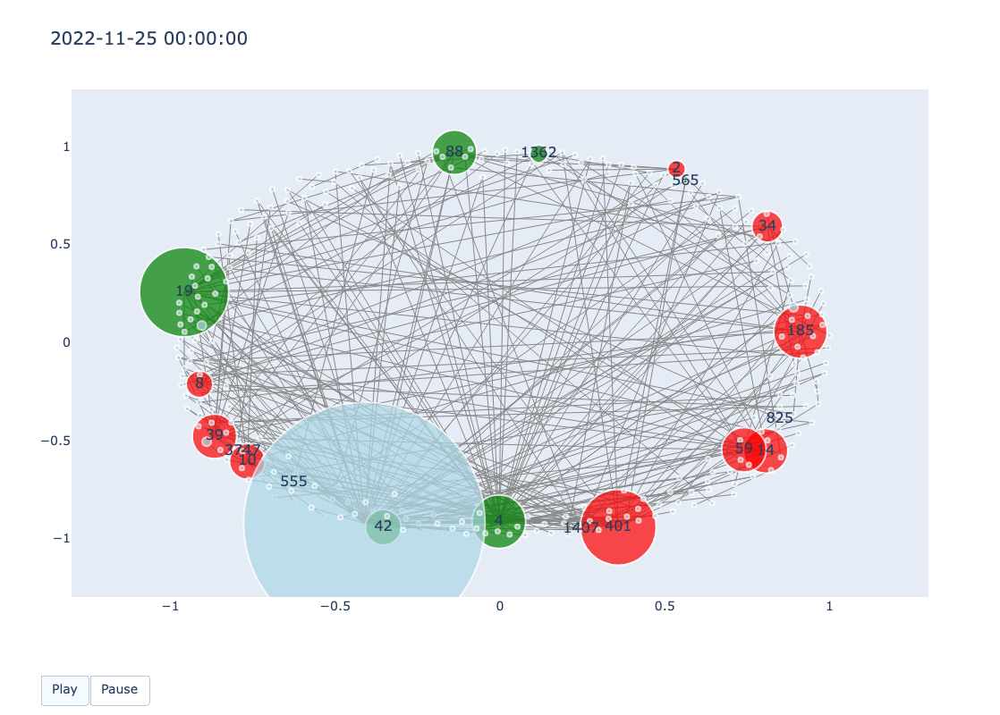

In [3]:
# 우선 앞에 10개
dates = sorted(data['date'].unique())
dates = dates[32:48] # 11.10~11.24 : 17:32, 11.24~12.10 32:48, 2.5~2.20 104:120

# 해당기간에 가장 많이 전송/수신한 50개의 주소만 추출
top_sender_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('sender_address')['amount'].max().nlargest(50).index
top_receiver_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('receiver_address')['amount'].max().nlargest(50).index

# 이름이 안맞긴 하지만 코드에서 전체적으로 바꾸기 번거로워서 우선 사용
top_15_common_nodes = top_sender_30.union(top_receiver_30)

traces = []
buttons = []

node_label_mapping = {}
label_counter = 1

# Initialize min and max for x and y to calculate global range
global_x_min, global_x_max = float('inf'), float('-inf')
global_y_min, global_y_max = float('inf'), float('-inf')

# Initialize a dictionary to store the positions of nodes from the previous day
previous_pos = {}

#----------------------------------------------------------------------------------------------------------------------------------#
#-------------------------------------------------- 위치 정하는 코드  -----------------------------------------------------------------#
#----------------------------------------------------------------------------------------------------------------------------------#

# Iterate through the dates to create frames and find global ranges
for date in dates:
    daily_df = data[data['date'] == date]
    
    # 상위 10개의 송신/수신 노드를 선택
    daily_data = daily_df.sort_values('amount', ascending=False)
    daily_data = daily_data.head(300)
    
    G = nx.DiGraph()

    for _, row in daily_data.iterrows():
        sender = row['sender_address']
        receiver = row['receiver_address']
        amount = row['amount']

        if sender not in node_label_mapping:
            node_label_mapping[sender] = f"{label_counter}"
            label_counter += 1
        if receiver not in node_label_mapping:
            node_label_mapping[receiver] = f"{label_counter}"
            label_counter += 1

        G.add_node(sender, label=node_label_mapping[sender])
        G.add_node(receiver, label=node_label_mapping[receiver])
        G.add_edge(sender, receiver, weight=amount)

    # Use the previous positions as the initial positions for the current day's layout if available
    if previous_pos:
        pos = nx.spring_layout(G, k=10, iterations=50, pos=previous_pos)
    else:
        pos = nx.spring_layout(G, k=10, iterations=50)

    # Store the current positions for the next day's layout
    previous_pos = pos

    # Update global min and max values for x and y
    x_values = [p[0] for p in pos.values()]
    y_values = [p[1] for p in pos.values()]
    
    global_x_min, global_x_max = min(global_x_min, min(x_values)), max(global_x_max, max(x_values))
    global_y_min, global_y_max = min(global_y_min, min(y_values)), max(global_y_max, max(y_values))

# Use the global ranges to define fixed x and y ranges
fixed_x_range = [global_x_min * 1.3, global_x_max * 1.3]
fixed_y_range = [global_y_min * 1.3, global_y_max * 1.3]

#----------------------------------------------------------------------------------------------------------------------------------#
#-------------------------------------------------- 그래프 그리는 코드 -----------------------------------------------------------------#
#----------------------------------------------------------------------------------------------------------------------------------#

# Create frames with the fixed ranges
previous_pos = {}  # Reinitialize to reuse in the second loop
for date in dates:
    daily_df = data[data['date'] == date]

    daily_data = daily_df.sort_values('amount', ascending=False)
    daily_data = daily_data.head(300)

    
    G = nx.DiGraph()

    for _, row in daily_data.iterrows():
        sender = row['sender_address']
        receiver = row['receiver_address']
        amount = row['amount']

        # Sender address가 node_label_mapping에 없으면 추가
        if sender not in node_label_mapping:
            node_label_mapping[sender] = f"{label_counter}"
            
    
        # Receiver address가 node_label_mapping에 없으면 추가
        if receiver not in node_label_mapping:
            node_label_mapping[receiver] = f"{label_counter}"
            

        G.add_node(sender, label=node_label_mapping[sender])
        G.add_node(receiver, label=node_label_mapping[receiver]) 
        G.add_edge(sender, receiver, weight=amount)

    # Use the previous positions if available
    if previous_pos:
        pos = nx.spring_layout(G, k=10, iterations=50, pos=previous_pos)
    else:
        pos = nx.spring_layout(G, k=10, iterations=50)

    # Store positions for the next frame
    previous_pos = pos

    edge_x = []
    edge_y = []
    edge_hover_texts = []
    edge_widths = []

    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_hover_texts.append(f'{node_label_mapping[edge[0]]} → {node_label_mapping[edge[1]]}<br>Amount: {G.edges[edge]["weight"]}')
        edge_widths.append(np.log(G.edges[edge]["weight"] + 1))

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='#888'),
        hoverinfo='text',
        text=edge_hover_texts,
        mode='lines',
    )

    node_x = []
    node_y = []
    node_sizes = []
    node_colors = []
    node_hover_texts = []
    node_labels = []

    for node in G.nodes():
        
        # 송신된 amount의 합
        sent_amount = daily_df.groupby('sender_address')['amount'].sum()
        # 수신된 amount의 합 (존재하지 않으면 0으로 설정)
        received_amount = daily_df.groupby('receiver_address')['amount'].sum()
        # 송신된 amount 값이 있으면 가져오고, 없으면 0으로 설정
        sent = sent_amount[node] if node in sent_amount else 0
        # 수신된 amount 값이 있으면 가져오고, 없으면 0으로 설정
        received = received_amount[node] if node in received_amount else 0
        total_amount = sent+received
        
        if node in top_sender_30 and node in top_receiver_30:
            node_colors.append('green')  # top_sender와 top_receiver 모두에 속하면 녹색
        elif node in top_sender_30:
            node_colors.append('orange')  # top_sender에만 속하면 주황색
        elif node in top_receiver_30:
            node_colors.append('red')     # top_receiver에만 속하면 빨간색
        else:
            node_colors.append('lightblue')       
            
        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_sizes.append(max(len(list(G.neighbors(node))) * 5, 5))  # 주위에 존재하는 node의 수로 크기를 표현
        
        # 하늘색이 아닌 노드만 주소 표시
        if node in top_15_common_nodes:
            node_labels.append(node_label_mapping[node])
        else:
            node_labels.append("")  # 하늘색 노드에는 라벨을 표시하지 않음
        
        node_hover_texts.append(f'Node: {node}<br>Total Amounts: {total_amount}<br>Type: {"Sender and Receiver" if node in top_sender_30 and node in top_receiver_30 else "Sender" if node in top_sender_30 else "Receiver" if node in top_receiver_30 else "etc"}')

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=node_labels,
        textposition='top center',
        textfont=dict(size=12),
        hoverinfo='text',
        hovertemplate=node_hover_texts,
        marker=dict(
            showscale=False,
            color=node_colors,
            size=node_sizes,
            line_width=2,
        )
    )

    traces.append(go.Frame(
        data=[edge_trace, node_trace],
        name=date.strftime('%Y-%m-%d'),
        layout=go.Layout(
            xaxis=dict(range=fixed_x_range),
            yaxis=dict(range=fixed_y_range),
        )
    ))

layout = go.Layout(
    title=f'{dates[0]}',
    updatemenus=[{
        'type': "buttons",
        'buttons': [
            dict(
                label="Play",
                method="animate",
                args=[None, dict(frame=dict(duration=2000, redraw=True), fromcurrent=True)]
            ),
            dict(
                label="Pause",
                method="animate",
                args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate", transition=dict(duration=0))]
            )
        ],
        'direction': 'left',
        'pad': dict(r=10, t=87),
        'showactive': True,
        'x': 0.1,
        'xanchor': "right",
        'y': 0,
        'yanchor': "top"
    }],
    xaxis=dict(showgrid=False, zeroline=False, range=fixed_x_range),
    yaxis=dict(showgrid=False, zeroline=False, range=fixed_y_range),
    width=1200,
    height=800,
    showlegend=False
)


layout.update({
    'title': f'{dates[0].strftime('%Y-%m-%d')}',
    'xaxis': dict(showgrid=False, zeroline=False, range=fixed_x_range),
    'yaxis': dict(showgrid=False, zeroline=False, range=fixed_y_range),
    'width': 1200,
    'height': 800,
    'showlegend': False,
    'font': dict(size=14),  # Increase the font size
})

# Update the title with the date when frames change
for frame in traces:
    frame.layout.title = frame.name

# Modify the traces to include better text visibility
for frame in traces:
    for trace in frame.data:
        if trace.mode == 'markers+text':
            trace.update(textposition='middle center',  # Adjust text position
                         textfont=dict(size=16))  # Increase text font size for better visibility

fig = go.Figure(
    data=[traces[0].data[0], traces[0].data[1]],
    layout=layout,
    frames=traces
)

plotly.offline.plot(fig, auto_play = False)


fig.show()

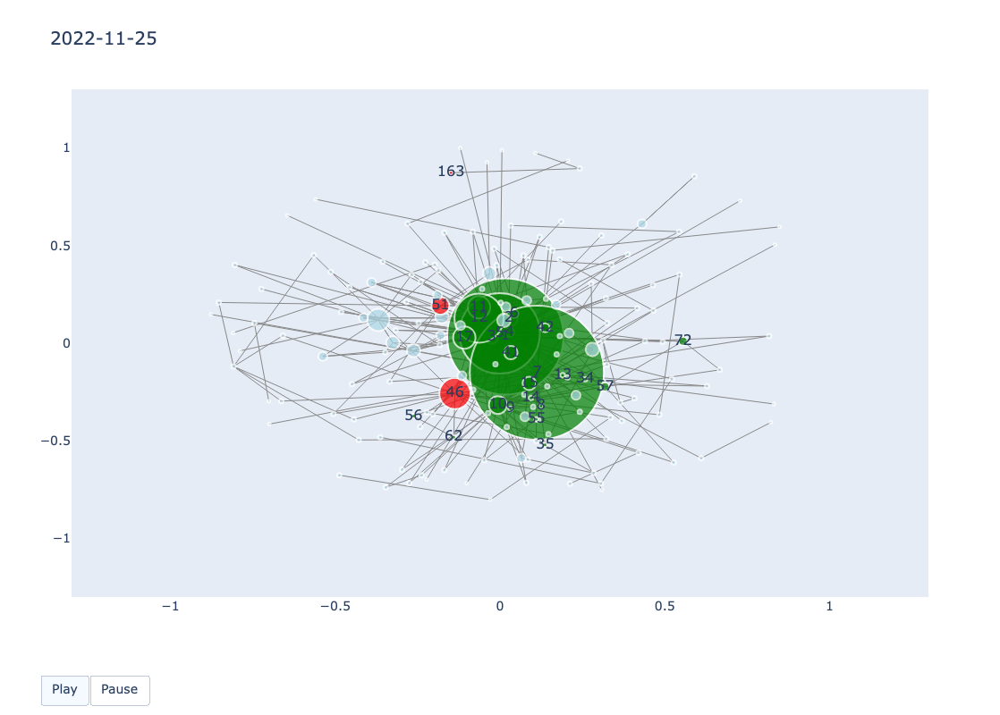

In [37]:
dates = sorted(data['date'].unique())
dates = dates[32:48] # 11.10~11.24 : 17:32, 11.24~12.10 32:48, 2.9~2.23 108:123

# 해당기간에 가장 많이 전송/수신한 50개의 주소만 추출
top_sender_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('sender_address')['amount'].max().nlargest(50).index
top_receiver_30 = data[(data['date']>=dates[0])&(data['date']<=dates[-1])].groupby('receiver_address')['amount'].max().nlargest(50).index

# 이름이 안맞긴 하지만 코드에서 전체적으로 바꾸기 번거로워서 우선 사용
top_15_common_nodes = top_sender_30.union(top_receiver_30)

traces = []
buttons = []

node_label_mapping = {}
label_counter = 1

# Initialize the global min and max for x and y to calculate global range
global_x_min, global_x_max = float('inf'), float('-inf')
global_y_min, global_y_max = float('inf'), float('-inf')

# First loop to determine global ranges
for date in dates:
    daily_df = data[data['date'] == date]

    # Select the top 300 transactions by amount
    daily_data = daily_df.sort_values('amount', ascending=False)
    daily_data = daily_data.head(300)

    # Create a new directed graph
    G = nx.DiGraph()

    # Add nodes and edges for the current day's transactions
    for _, row in daily_data.iterrows():
        sender = row['sender_address']
        receiver = row['receiver_address']
        amount = row['amount']
        if sender not in node_label_mapping:
            node_label_mapping[sender] = f"{label_counter}"
            label_counter += 1
        if receiver not in node_label_mapping:
            node_label_mapping[receiver] = f"{label_counter}"
            label_counter += 1

        G.add_node(sender)
        G.add_node(receiver)
        G.add_edge(sender, receiver, weight=amount)

    # Compute node positions with spring layout
    pos = nx.spring_layout(G, k=10, iterations=50)
    
    # Update global min and max for x and y
    x_values = [p[0] for p in pos.values()]
    y_values = [p[1] for p in pos.values()]

    global_x_min, global_x_max = min(global_x_min, min(x_values)), max(global_x_max, max(x_values))
    global_y_min, global_y_max = min(global_y_min, min(y_values)), max(global_y_max, max(y_values))

# Use the global ranges to define fixed x and y ranges
fixed_x_range = [global_x_min * 1.3, global_x_max * 1.3]
fixed_y_range = [global_y_min * 1.3, global_y_max * 1.3]

# Create frames for each date
traces = []
for date in dates:
    daily_df = data[data['date'] == date]
    sent_amount = daily_df.groupby('sender_address')['amount'].sum()
    received_amount = daily_df.groupby('receiver_address')['amount'].sum()
    
    daily_data = daily_df.sort_values('amount', ascending=False)
    daily_data = daily_data.head(300)
    
    # Reinitialize the graph
    G = nx.DiGraph()

    for _, row in daily_data.iterrows():
        sender = row['sender_address']
        receiver = row['receiver_address']
        amount = row['amount']

        # Sender address가 node_label_mapping에 없으면 추가
        if sender not in node_label_mapping:
            node_label_mapping[sender] = f"{label_counter}"
            
    
        # Receiver address가 node_label_mapping에 없으면 추가
        if receiver not in node_label_mapping:
            node_label_mapping[receiver] = f"{label_counter}"

        G.add_node(sender)
        G.add_node(receiver)
        G.add_edge(sender, receiver, weight=amount)

    # Compute node positions using spring layout
    pos = nx.spring_layout(G, k=10, iterations=50)

    # Prepare data for edges
    edge_x = []
    edge_y = []
    edge_hover_texts = []
    edge_widths = []

    for edge in G.edges():
        x0, y0 = pos[edge[0]]
        x1, y1 = pos[edge[1]]
        edge_x.extend([x0, x1, None])
        edge_y.extend([y0, y1, None])
        edge_hover_texts.append(f'{edge[0]} → {edge[1]}<br>Amount: {G.edges[edge]["weight"]}')
        edge_widths.append(np.log(G.edges[edge]["weight"] + 1))

    edge_trace = go.Scatter(
        x=edge_x, y=edge_y,
        line=dict(width=1, color='#888'),
        hoverinfo='text',
        text=edge_hover_texts,
        mode='lines',
    )

    # Prepare data for nodes
    node_x = []
    node_y = []
    node_sizes = []
    node_colors = []
    node_hover_texts = []
    node_labels = []

    for node in G.nodes():
        sent = sent_amount.get(node, 0)
        received = received_amount.get(node, 0)
        total_amount = sent + received
        
        if node in top_sender_30 and node in top_receiver_30:
            node_colors.append('green')
        elif node in top_sender_30:
            node_colors.append('orange')
        elif node in top_receiver_30:
            node_colors.append('red')
        else:
            node_colors.append('lightblue')

        x, y = pos[node]
        node_x.append(x)
        node_y.append(y)
        node_sizes.append(max(len(list(G.neighbors(node))) * 5, 3))  # 주위에 존재하는 node의 수로 크기를 표현

        if node in top_15_common_nodes:
            node_labels.append(node_label_mapping[node])
        else:
            node_labels.append("")

        node_hover_texts.append(f'Name: {"etc" if node not in label_dict else  str(label_dict[node]) if pd.notna(label_dict[node]) else "specific"}<br>Node : {node}<br>Total Amounts: {total_amount}<br>Type: {"Sender and Receiver" if node in top_sender_30 and node in top_receiver_30 else "Sender" if node in top_sender_30 else "Receiver" if node in top_receiver_30 else "etc"}')

    node_trace = go.Scatter(
        x=node_x, y=node_y,
        mode='markers+text',
        text=node_labels,
        textposition='top center',
        textfont=dict(size=12),
        hoverinfo='text',
        hovertemplate=node_hover_texts,
        marker=dict(
            showscale=False,
            color=node_colors,
            size=node_sizes,
            line_width=2,
        )
    )

    traces.append(go.Frame(
        data=[edge_trace, node_trace],
        name=date.strftime('%Y-%m-%d'),
        layout=go.Layout(
            xaxis=dict(range=fixed_x_range),
            yaxis=dict(range=fixed_y_range),
        )
    ))

# Define layout and add play/pause buttons
layout = go.Layout(
    title=f'{dates[0]}',
    updatemenus=[{
        'type': "buttons",
        'buttons': [
            dict(
                label="Play",
                method="animate",
                args=[None, dict(frame=dict(duration=3000, redraw=True), fromcurrent=True)]
            ),
            dict(
                label="Pause",
                method="animate",
                args=[[None], dict(frame=dict(duration=0, redraw=False), mode="immediate", transition=dict(duration=0))]
            )
        ],
        'direction': 'left',
        'pad': dict(r=10, t=87),
        'showactive': True,
        'x': 0.1,
        'xanchor': "right",
        'y': 0,
        'yanchor': "top"
    }],
    xaxis=dict(showgrid=False, zeroline=False, range=fixed_x_range),
    yaxis=dict(showgrid=False, zeroline=False, range=fixed_y_range),
    width=1200,
    height=800,
    showlegend=False
)

layout.update({
    'title': f"{dates[0].strftime('%Y-%m-%d')}",
    'xaxis': dict(showgrid=False, zeroline=False, range=fixed_x_range),
    'yaxis': dict(showgrid=False, zeroline=False, range=fixed_y_range),
    'width': 1200,
    'height': 800,
    'showlegend': False,
    'font': dict(size=14),  # Increase the font size
})

# Update the title with the date when frames change
for frame in traces:
    frame.layout.title = frame.name

# Modify the traces to include better text visibility
for frame in traces:
    for trace in frame.data:
        if trace.mode == 'markers+text':
            trace.update(textposition='middle center',  # Adjust text position
                         textfont=dict(size=16))  # Increase text font size for better visibility

# Create the figure and plot it
fig = go.Figure(
    data=[traces[0].data[0], traces[0].data[1]],
    layout=layout,
    frames=traces
)

plotly.offline.plot(fig, auto_play=False)
fig.show()

In [38]:
pyo.plot(fig, filename = f'./network_{str(dates[0])[:10]}_{str(dates[-1])[:10]}_neighbors.html', auto_open=True, auto_play=False)

'./network_2022-11-25_2022-12-10_neighbors.html'